## 0. This checkout, not whatever is installed

`zou_lab_control_v2` is the one entry: importing it puts this checkout's eight layers
on the path, ahead of anything else.  It has to come **first** -- if a `zlc_*` module
was already imported from somewhere else, it refuses out loud rather than leaving two
copies in one kernel.  (If that happens: restart the kernel and run this cell first.)


In [ ]:
import sys
from pathlib import Path

_here = Path.cwd().resolve()
while not (_here / 'zou_lab_control_v2').is_dir() and _here != _here.parent:
    _here = _here.parent
sys.path.insert(0, str(_here))

import zou_lab_control_v2

print('code in use:', zou_lab_control_v2.ROOT)


# zlc_plot 使用示例

这个 Notebook 按功能演示固定 snapshot、selector、fit、语义编辑、所有 plot kind、持续 live 数据，以及 PyQt5 GUI。每个显示都使用同一个 raster host API。

In [1]:
import os, sys, time
from pathlib import Path
from threading import Event, Thread
import numpy as np
repo_root = Path.cwd()
if not (repo_root / 'src' / 'zlc_plot' / '__init__.py').is_file():
    repo_root = next((p for p in (Path.cwd(), *Path.cwd().parents) if (p / 'src' / 'zlc_plot' / '__init__.py').is_file()), repo_root)
sys.path.insert(0, str(repo_root)); sys.path.insert(0, str(repo_root / 'src'))
from examples.notebook_data import Axis, DatasetSchema, DatasetSnapshot, PointTable, PointTopology
from zlc_plot import (AxisRef, BackendUnavailableError, CurvePlot, DEFAULTS, DEFAULT_UNITS, FacetGridPlot, FitCancelled, FitEvent, FitModelSpec, FitTarget, HistogramPlot, ImageFrame, ImagePlot, ImagePointOverlay, LiveDataRevision, LivePlotController, NumericRange, PlotKind, PlotLabels, PlotSession, PlotSpec, PointStatus, PulseAnalogTrace, PulseBlock, PulseChannel, PulseDacScanSegment, PulseRepeatMarker, PulseScanRegion, PulseTimelineData, PulseTimelinePlot, PulseTimelineSelectionData, RasterPlotHost, Reduction, RollingPlot, SelectionChange, SelectorData, SelectorKind, Unit, UnitRegistry, __version__, curve, describe_semantics, ensure_qt5_application, facet_grid, histogram, image, parameter_controls, pulse_timeline, resolve_unit, rolling, schema_summary, show, updated_spec)
print('zlc_plot', __version__, 'ready from', repo_root)

zlc_plot 1.1.0 ready from C:\Users\eadri\Dropbox\WorkCode\Github\zlc_plot


## 1. 固定 `(R, P, *data_dim)` geometry

两个 scan 轴写入 PointTopology，`site` 稍后作为 data dimension；所有 plot kind 都消费同一个 immutable snapshot。

In [2]:
x_axis = Axis.create('x', values=np.linspace(-2.4e-3, 2.4e-3, 41), canonical_unit='V', label='X')
y_axis = Axis.create('y', values=np.linspace(-1.6e-3, 1.6e-3, 25), canonical_unit='V', label='Y')
x_rows = np.tile(np.asarray(x_axis.coordinates), y_axis.size)
y_rows = np.repeat(np.asarray(y_axis.coordinates), x_axis.size)
points = PointTable.from_columns({'x': x_rows, 'y': y_rows}, units={'x': 'V', 'y': 'V'})
topology = PointTopology.from_cartesian((y_axis, x_axis), point_table=points)
x_ref, y_ref = AxisRef.point_dimension('x'), AxisRef.point_dimension('y')
print('points:', points.row_count, 'topology:', topology.logical_shape, 'axis refs:', x_ref, y_ref)

points: 1025 topology: (25, 41) axis refs: AxisRef(domain=<AxisDomain.POINT_DIMENSION: 'point_dimension'>, axis_id='x') AxisRef(domain=<AxisDomain.POINT_DIMENSION: 'point_dimension'>, axis_id='y')


## 2. 生成 immutable snapshot

数据函数只生成 `zlc_data.OwnedSnapshot`；session、selector 和 fit 属于 zlc_plot。

In [3]:
repeat_axis = Axis.create('repeat', values=np.arange(32), label='Repeat')
site_axis = Axis.create('site', size=1, label='Site')
schema = DatasetSchema.create(repeat_axis, points, data_axes=(site_axis,), point_topology=topology, canonical_unit='V', dtype=np.float64)

def make_snapshot(revision, phase=0.0):
    center = 0.35e-3 * np.sin(phase)
    profile = np.exp(-0.5 * ((x_rows - center) / 0.68e-3) ** 2)
    profile *= 0.55 + 0.45 * np.exp(-0.5 * (y_rows / 0.9e-3) ** 2)
    repeat = np.arange(schema.repeat_axis.size, dtype=float)
    offsets = 0.08e-3 * np.sin(2 * np.pi * repeat / schema.repeat_axis.size + phase)
    values = (0.35e-3 + 2.2e-3 * profile)[None, :, None] + offsets[:, None, None]
    return DatasetSnapshot(schema, values, revision=revision)

snapshot = make_snapshot(0)
print('snapshot:', snapshot.block.values.shape, 'revision:', snapshot.ref.revision.value, 'schema:', schema_summary(snapshot.block.schema))

snapshot: (32, 1025, 1) revision: 0 schema: repeat 32 × scan (y 25 × x 41) → value (V)


## 3. Curve：Area selector 和显式 selector_data

Area 在一个 session 中只有一份；`selector_data()` 只在这一格被调用时物化数据。

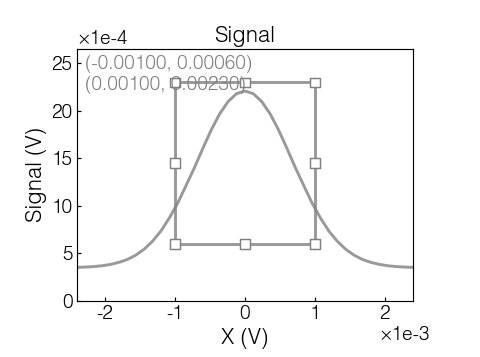

curve kind: True selector data: True rows: 12170
selection event: True selector count: 1


In [4]:
curve_session = curve(snapshot, x_ref, reduction=Reduction.MEDIAN, labels=PlotLabels(title='Signal', x='X', y='Signal'), size='2x2')
selection_events = []
unsubscribe_selection = curve_session.subscribe_selection(lambda event: selection_events.append(event))
curve_session.set_area_selector(NumericRange(-1.0e-3, 1.0e-3), NumericRange(0.6e-3, 2.3e-3))
curve_selection = curve_session.selector_data(SelectorKind.AREA)
curve_view = show(curve_session)
unsubscribe_selection()
print('curve kind:', curve_session.spec.kind is PlotKind.CURVE, 'selector data:', isinstance(curve_selection, SelectorData), 'rows:', curve_selection.canonical_values.size)
print('selection event:', isinstance(selection_events[-1].change, SelectionChange), 'selector count:', len(curve_session.selectors))

## 4. Fit：使用同一个 Area scope，但把最终注释与 selector 标注分开显示

这里先拟合当前 Area，再清除 selector；这样教程截图不会让左上角 selector 数值和 fit 注释重叠。

In [5]:
fit_events: list[FitEvent] = []
def record_fit(event: FitEvent):
    fit_events.append(event)
unsubscribe_fit = curve_session.subscribe_fit(record_fit)
fit_model = curve_session.fit_models[0]
curve_fit = curve_session.fit('gaussian_offset', live=False)
curve_session.remove_selector(SelectorKind.AREA)
unsubscribe_fit()
try:
    raise FitCancelled('example: a superseded fit is reported through this exception')
except FitCancelled as error:
    cancellation_text = str(error)
print('model:', isinstance(fit_model, FitModelSpec), 'target:', FitTarget.SERIES in fit_model.targets)
print('fit parameters:', dict(curve_fit.parameters), 'fit events seen:', len(fit_events), 'cancel:', cancellation_text)

model: True target: True
fit parameters: {'amplitude': 0.0018743435036188336, 'offset': 0.0003355164029971195, 'sigma': 0.0006814678159812246, 'center': -1.0173581078954984e-20} fit events seen: 0 cancel: example: a superseded fit is reported through this exception


## 5. 低开销 display parameter 修改、单位和保存

这些 setter 复用同一 session surface；单位解析仍由 `UnitRegistry` 唯一维护。

In [6]:
curve_session.set_axis_unit(x_ref, 'mV')
curve_session.set_value_unit('mV')
curve_session.set_labels(title='Static signal', x='Bias', y='Response')
curve_session.set_relim_mode('tight')
curve_session.set_y_limits(0.0, 3.0)
curve_session.set_size('2x4')
curve_session.save(repo_root / 'zlc_plot_usage.png', dpi=150)
custom_unit = Unit('arb', 'tutorial', aliases=('a.u.',))
custom_registry = UnitRegistry((custom_unit,))
print('display:', curve_session.describe_display().size, 'canonical mV:', resolve_unit('mV', DEFAULT_UNITS).symbol)
print('custom unit:', custom_registry.resolve('a.u.').symbol, 'saved:', repo_root / 'zlc_plot_usage.png')

display: 2x4 canonical mV: mV
custom unit: arb saved: C:\Users\eadri\Dropbox\WorkCode\Github\zlc_plot\zlc_plot_usage.png


## 6. Image：`ImageFrame` overlay、canonical geometry 和 color limits

点坐标/状态是普通 Image 的动态 overlay，不是另一个 plot kind。

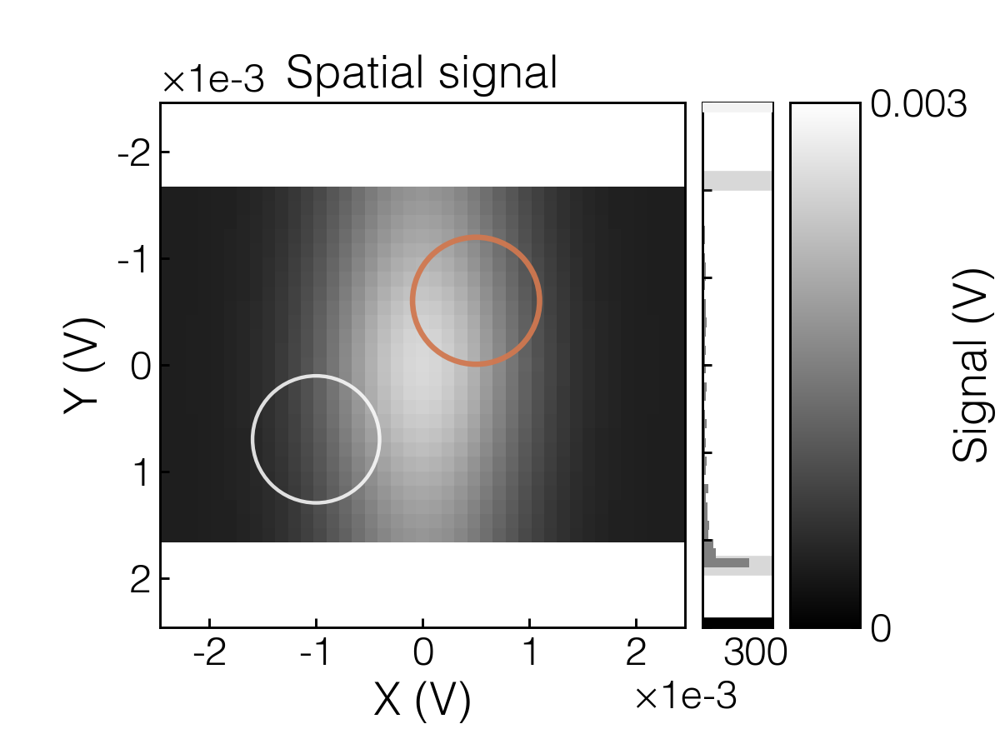

image kind: True frame: True overlay revision: 0


In [7]:
overlay = ImagePointOverlay(0, np.array([[-1.0e-3, 0.7e-3], [0.5e-3, -0.6e-3]]), ('p1', 'p2'), ('A', 'B'), (PointStatus.EMPTY, PointStatus.OCCUPIED))
image_frame = ImageFrame(snapshot, overlay)
image_session = image(image_frame, x_ref, y_ref, labels=PlotLabels(title='Spatial signal', x='X', y='Y', value='Signal'), size='2x2')
image_session.set_color_limits(0.0, 3.0e-3)
image_view = show(image_session)
print('image kind:', isinstance(image_session.spec, ImagePlot), 'frame:', isinstance(image_frame, ImageFrame), 'overlay revision:', image_session.image_overlay_revision)

## 7. Histogram：bin number 在原图上更新

`bin_count` 是 display parameter；GUI 也调用同一个 `set_parameter`，不重建 Figure。

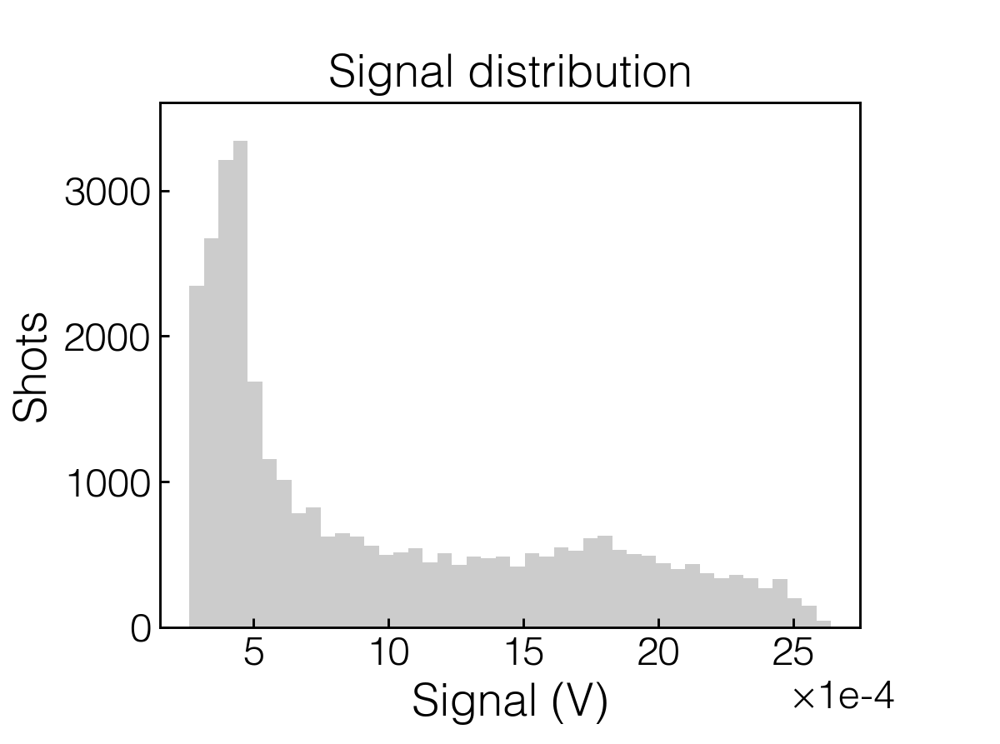

histogram kind: True bins: 80


In [8]:
histogram_session = histogram(snapshot, bins=48, labels=PlotLabels(title='Signal distribution', x='Signal', y='Shots'), size='2x2')
histogram_view = show(histogram_session)
histogram_session.set_parameter('bin_count', 80)
print('histogram kind:', isinstance(histogram_session.spec, HistogramPlot), 'bins:', histogram_session.describe_display().display_state['bin_count'])

## 8. Rolling：固定 snapshot 的 history 和 side distribution

Rolling 是 live plot 的特殊情况；静态 snapshot 也使用同一 rolling history projection。

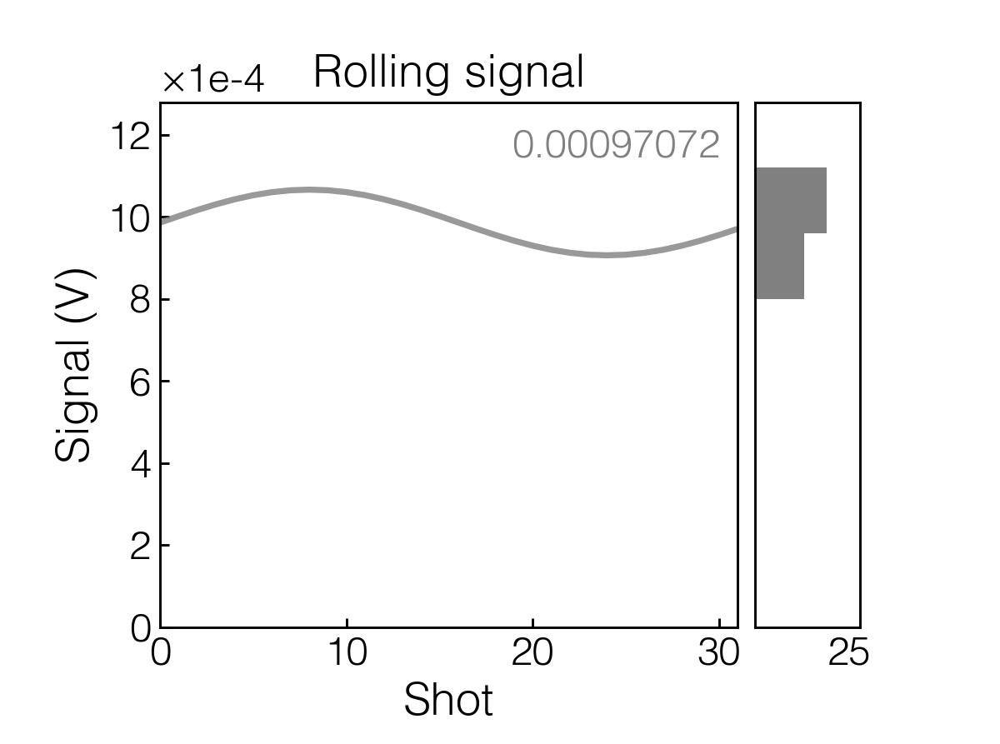

rolling kind: True side distribution: True


In [9]:
rolling_session = rolling(snapshot, window=32, side_distribution=True, labels=PlotLabels(title='Rolling signal', x='Shot', y='Signal'), size='2x2')
rolling_view = show(rolling_session)
print('rolling kind:', isinstance(rolling_session.spec, RollingPlot), 'side distribution:', rolling_session.describe_display().display_state['side_distribution'])

## 9. FacetGrid 和语义编辑

语义选择通过 `describe_semantics`/`updated_spec` 组成新 spec，再由 `replace_spec` 重画；display parameter 则继续走 in-place setter。

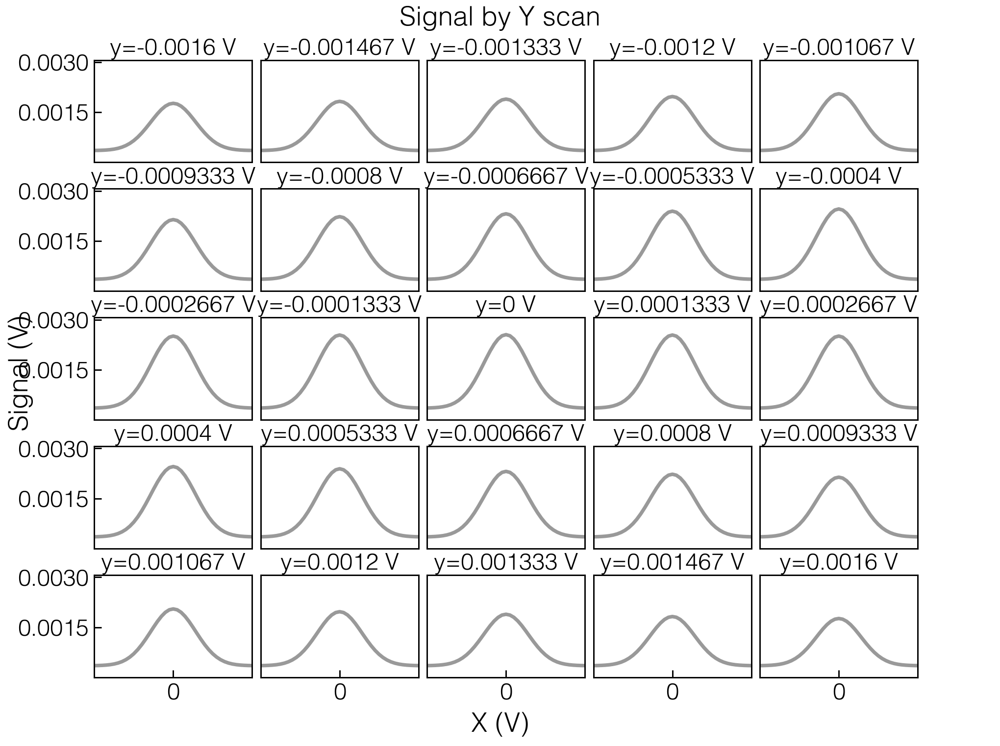

facet: True cells: 25
kind: True controls: 11 semantic fields: ['kind', 'x', 'group', 'reduction', 'facet']
session/spec: True True True


In [10]:
facet_session = facet_grid(snapshot, y_ref, CurvePlot(x_ref, labels=PlotLabels(x='X', y='Signal')), labels=PlotLabels(title='Signal by Y scan'), size='4x4')
facet_view = show(facet_session)
facet_description = describe_semantics(snapshot.block.schema, facet_session.spec, layout=DEFAULTS.layout)
display_description = facet_session.describe_display()
controls = parameter_controls(display_description.parameter_schema, display_description.display_state.values, choice_overrides=display_description.parameter_choices)
semantic_session = curve(snapshot, x_ref)
candidate = updated_spec(snapshot.block.schema, semantic_session.spec, 'reduction', Reduction.MEDIAN)
semantic_session.replace_spec(candidate)
print('facet:', isinstance(facet_session.spec, FacetGridPlot), 'cells:', len(facet_session._payload.cells))
print('kind:', facet_description.kind is PlotKind.FACET_GRID, 'controls:', len(controls), 'semantic fields:', [field.name for field in facet_description.fields])
print('session/spec:', isinstance(semantic_session, PlotSession), isinstance(semantic_session.spec, PlotSpec), semantic_session.spec.reduction is Reduction.MEDIAN)

## 10. Pulse timeline 和 typed selection data

Pulse timeline 是一个 plot kind；与其他主图相同，左键拖动和 `set_area_selector` 使用唯一的 AREA selector，四边、四角和整体都可实时拖动，点空白处即可取消。图中的橙色 scan region 是 pulse 数据内容，不是 selector；`selector_data` 返回专用 typed records。

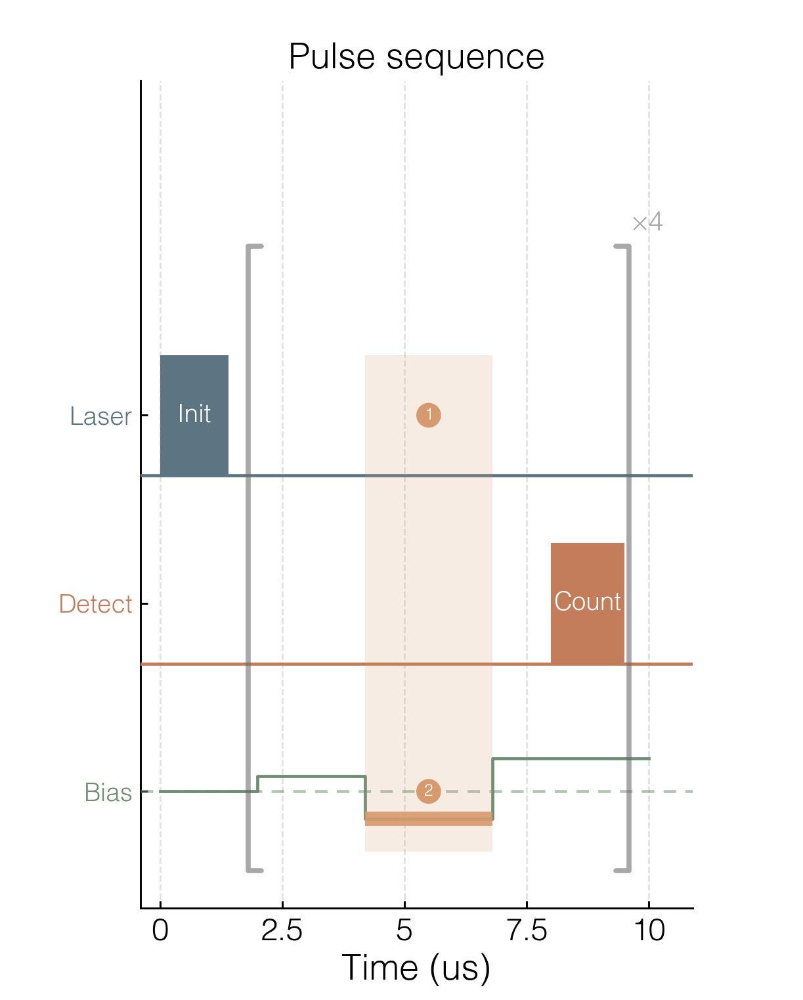

pulse kind: True selection: True
selected blocks: 1 envelope revision: 0


In [11]:
pulse_data = PulseTimelineData(channels=(PulseChannel('laser', 'Laser'), PulseChannel('detect', 'Detect')), blocks=(PulseBlock('laser', 0.0, 1.4e-6, 'Init'), PulseBlock('detect', 8.0e-6, 9.5e-6, 'Count')), analog_traces=(PulseAnalogTrace('bias', 'Bias', -1.0, 1.0, (0.0, 2.0e-6, 4.2e-6, 6.8e-6, 10.0e-6), (0.0, 0.25, -0.45, 0.55)),), scan_regions=(PulseScanRegion(4.2e-6, 6.8e-6, 1),), scan_dac_segments=(PulseDacScanSegment('bias', 4.2e-6, 6.8e-6, -0.45, 2),), repeat_markers=(PulseRepeatMarker(1.8e-6, 9.6e-6, '×4'),), time_unit='s', total_duration=10.0e-6)
pulse_session = pulse_timeline(pulse_data, labels=PlotLabels(title='Pulse sequence'), size='4x2')
pulse_view = show(pulse_session)
pulse_session.set_area_selector(NumericRange(0.4e-6, 3.0e-6), NumericRange(-0.4, 2.4), display=False)
pulse_selection = pulse_session.selector_data(SelectorKind.AREA)
pulse_envelope = LiveDataRevision(0, pulse_data)
print('pulse kind:', isinstance(pulse_session.spec, PulseTimelinePlot), 'selection:', isinstance(pulse_selection, PulseTimelineSelectionData))
print('selected blocks:', len(pulse_selection.blocks), 'envelope revision:', pulse_envelope.revision)

## 11. 真正持续更新的 live rolling

producer 只发布 immutable revision；controller 使用 bounded/latest-only ingress。Area selector 和 live fit 绑定同一个 session。

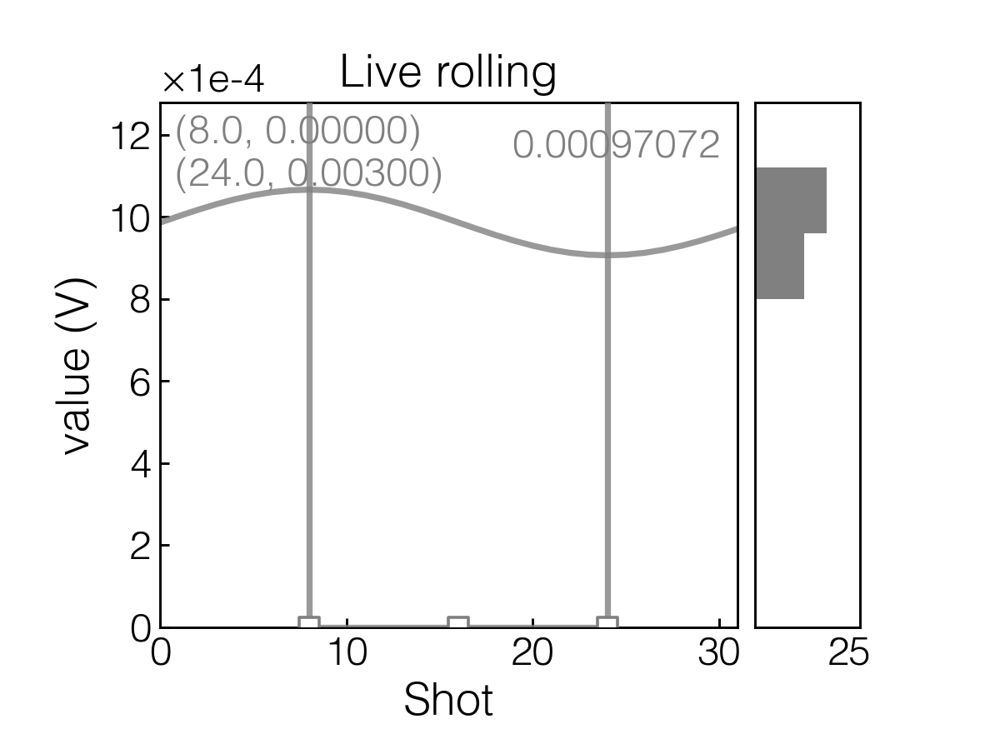

live controller: True fit future: Future


In [12]:
live_session = rolling(make_snapshot(0), window=32, side_distribution=True, labels=PlotLabels(title='Live rolling'))
live_session.set_area_selector(NumericRange(8.0, 24.0), NumericRange(0.0, 3.0e-3))
live_view = show(live_session)
live_controller = live_view.live_controller(make_snapshot(0), refresh_interval_ms=DEFAULTS.live.default_refresh_interval_ms).start()
live_fit = live_session.fit_async('gaussian_offset', live=True)
live_stop = Event()

def publish_live():
    revision = 0
    while not live_stop.wait(0.05):
        revision += 1
        live_controller.publish(make_snapshot(revision, phase=0.12 * revision))

live_thread = Thread(target=publish_live, name='notebook-live-producer', daemon=True)
live_thread.start()
print('live controller:', isinstance(live_controller, LivePlotController), 'fit future:', type(live_fit).__name__)

## 12. 查看 live metrics 并停止 producer

停止 producer 后显式关闭 controller；最后一帧仍留在 Notebook view。

In [13]:
time.sleep(1.0)
metrics = live_controller.metrics()
print('published:', metrics.published, 'successful:', metrics.successful_updates, 'last revision:', metrics.last_presented_revision)
live_stop.set()
live_thread.join(timeout=5.0)
live_controller.close(timeout=5.0)
print('live stopped; pending:', metrics.pending)

published: 91 successful: 12 last revision: 88
live stopped; pending: True


## 13. 启用 Notebook 的 Qt 事件循环

这一格等价于运行 `%gui qt`，但必须先让包创建带 High-DPI 属性的 QApplication；如果先运行 `%gui qt`，IPython 可能创建一个缺少 DPR 属性的 QApplication，当前进程只能重启后恢复。

In [14]:
# In a normal Jupyter session this is the literal magic: %gui qt
gui_enabled = os.environ.get('QT_QPA_PLATFORM') != 'offscreen'
gui_app = None
if gui_enabled:
    gui_app = ensure_qt5_application([])
    get_ipython().run_line_magic('gui', 'qt')
print('Qt event-loop integration:', 'enabled' if gui_enabled else 'skipped for offscreen execution')

Qt event-loop integration: enabled


## 14. PyQt5 GUI：使用仓库的 `create_window()` 入口

不要在 Notebook 里手搓 `Qt5PlotWidget`。`create_window()` 自己创建父窗口、参数面板、host、live producer，并返回必须保留的 handle；窗口可切换数据源、plot kind、参数、selector 和 fit。

In [15]:
gui_handle = None
if not gui_enabled:
    print('GUI creation skipped only for headless notebook execution')
else:
    try:
        from examples.pyqt5_embed import create_window
        from zlc_plot import Qt5ParameterPanel, Qt5PlotWidget
        if gui_app is None:
            gui_app = ensure_qt5_application([])
        gui_handle = create_window()
    except (BackendUnavailableError, ModuleNotFoundError) as error:
        print('PyQt5 example unavailable:', error)
    else:
        print('window shown:', not gui_handle.closed, 'same app:', gui_handle.application is gui_app)
        print('host/widget/panel:', isinstance(gui_handle.plot_host, RasterPlotHost), isinstance(gui_handle.plot_widget, Qt5PlotWidget), isinstance(gui_handle.parameter_panel, Qt5ParameterPanel))

window shown: True same app: True
host/widget/panel: True True True


## 15. 显式关闭 GUI handle

关闭格是 GUI 示例的一部分；它等待 live worker、host 和 widget 完整退出。

In [16]:
if gui_handle is not None:
    print('gui closed:', gui_handle.close(wait=True))
else:
    print('gui close skipped because PyQt5 is unavailable')

gui close skipped because PyQt5 is unavailable


## 16. 关闭其余资源

关闭只释放 worker/controller/view，不改变 immutable snapshot。

In [17]:
for view in (curve_view, image_view, histogram_view, rolling_view, facet_view, pulse_view, live_view):
    view.close()
for session in (curve_session, image_session, histogram_session, rolling_session, facet_session, pulse_session, live_session, semantic_session):
    session.close()
print('all tutorial resources closed')

all tutorial resources closed
